In [1]:
%cd ..
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # use cpu because I'm training on gpu

# from thumbs.experiments.pokemon_conditional_types_v4_deep import PokemonExperiment
from thumbs.viz import show_samples, visualize_preprocessed_image, visualize_grid
from thumbs.data import load_and_preprocess_image
import tensorflow as  tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from thumbs.util import normalize_image, unnormalize_image


/home/anthony/workspace/yt-data


2023-09-16 22:43:50.157679: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# from thumbs.experiments.wow_diffusion import MyExperiment 
from thumbs.experiments.wow_diffusion_attention import MyExperiment 
from thumbs.train  import TrainDiffusion

exp = MyExperiment()
mparams = exp.get_mutable_params()[0]

train: TrainDiffusion = exp.get_train(exp.get_model(mparams).build(), mparams)
train.load_weights()
data = exp.get_data()
if not isinstance(data, tf.data.Dataset):
    data = tf.data.Dataset.from_tensor_slices(data)
data = exp.prepare_data(data, mparams)

2023-09-16 22:43:52.165524: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Model: "diffusion_model"
________________________________________________________________________________________________________________________________________________________________________________________________________
 Layer (type)                                               Output Shape                                                Param #             Connected to                                                
 t (InputLayer)                                             [(None, 1)]                                                 0                   []                                                          
                                                                                                                                                                                                        
 image (InputLayer)                                         [(None, 64, 64, 3)]                                         0                   []                             

See the kinds of things that the model predicts as noise

Loaded previous weights


<Figure size 640x480 with 0 Axes>

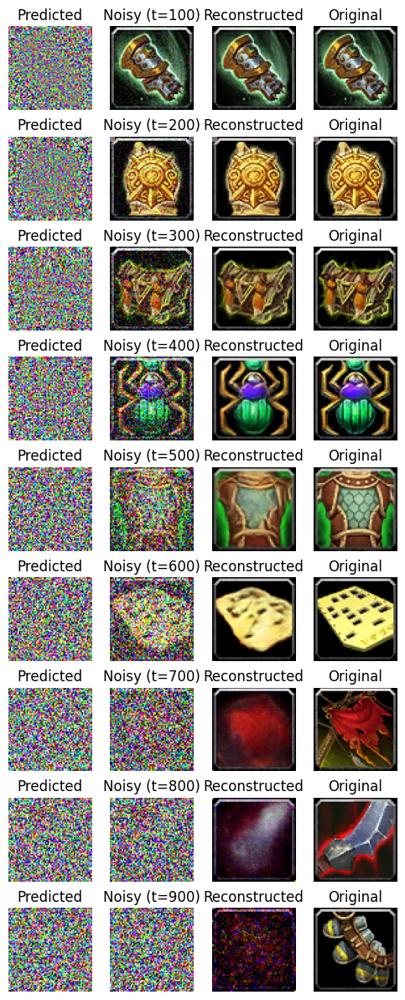

In [3]:

train.load_weights()
samples = train.diffusion.show_samples(data)


Loaded previous weights


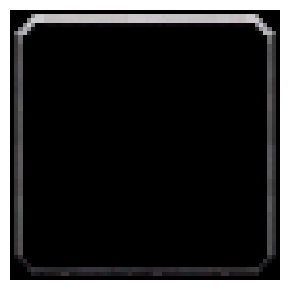

In [5]:

# online version
train.load_weights()
samples, intermediate = train.diffusion.sample_intermediate(1)
visualize_grid(samples, rows=1, normalized=False)



In [17]:
np.percentile(intermediate[800], 99)

0.6281795233488056

In [ ]:
# Show a plot with  each image in a single row
from thumbs.params import DiffusionHyperParams
from thumbs.diffusion import Diffusion
from thumbs.util import unnormalize_image

it = iter(data)
item = next(it)

def view_noise_range(d: Diffusion):
    sample_interval = 10
    images = []

    print(d.mparams.T)
    cur_item  = np.expand_dims(item[0], axis=0)
    for i, t in enumerate(range(0, d.mparams.T, sample_interval)):
        t_tf = tf.constant(t, dtype=tf.int32, shape=(1,1))
        final_img, noise = d.add_noise(cur_item, t_tf)
        final_img = unnormalize_image(final_img[0].numpy())
        images.append(final_img)

    visualize_grid(images, rows=4, normalized=False)

    # fig, axes = plt.subplots(nrows=1, ncols=len(images), figsize=(30, 6))
    # for i, img in enumerate(images):
    #     axes[i].imshow(img)
    #     axes[i].axis('off')  # Hide the axes ticks and labels

    # plt.subplots_adjust(wspace=0.0, hspace=0)
    # plt.tight_layout()
    # plt.show()


beta_start = .0001
beta_end = .0085

cos = DiffusionHyperParams(
    learning_rate=0.0002,
    batch_size=256,
    # adam_b1=0.5,
    iterations=100000,
    sample_interval=1,
    T=1000,
    beta_start=beta_start,
    beta_end=beta_end,

    # beta_start=.0002,
    # beta_end=0.009,

    beta_schedule_type="easein",
)
view_noise_range(Diffusion(cos, train.params, train.built_model.model ))


lin = DiffusionHyperParams(
    learning_rate=0.0002,
    batch_size=256,
    # adam_b1=0.5,
    iterations=100000,
    sample_interval=1,
    T=1000,
    beta_start=beta_start,
    beta_end=beta_end,

    # beta_start=.0002,
    # beta_end=0.009,

    beta_schedule_type="linear",
)
print("linear")
view_noise_range(Diffusion(lin, train.params, train.built_model.model ))

## Show each noise level

In [ ]:
T = 300
batch_size = 128

r = np.random.randint(0, T - 1, size=(batch_size, 1))
# t = tf.constant([[np.random.randint(0, T-1)]] * batch_size, dtype=tf.int32)

r.shape

(128, 1)

# Show some predictions

In [ ]:
train.show_samples(data)

# Do a bunch of iterations on a single image

### Pick an image

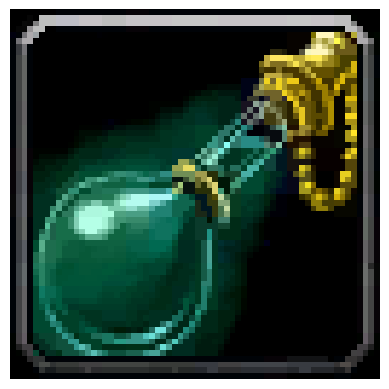

In [ ]:
# Get a random image from the dataset
it = iter(data)
final_img = next(it)[0]
final_img = np.expand_dims(final_img, axis=0)
visualize_preprocessed_image(final_img[0])

### Noise it up

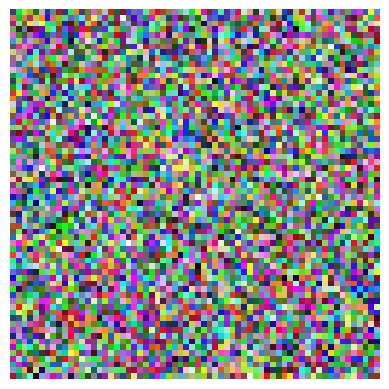

In [ ]:
max_t = mparams.T - 1

noisy_img, noise = train.add_noise(final_img, np.expand_dims(max_t, axis=0))
visualize_preprocessed_image( noisy_img.numpy()[0])

### Un-noise it
Manually, without the model

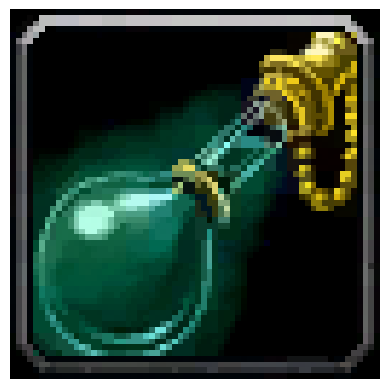

In [ ]:
un_noised = train.remove_noise(noisy_img, noise, np.expand_dims(max_t, axis=0))
visualize_preprocessed_image(un_noised.numpy()[0])

# Generate new images


In [ ]:
# online version
train.load_weights()
final_img = train.sample(1)

plt.imshow(final_img[0].numpy())
plt.show()

Loaded previous weights


  2%|▏         | 20/999 [00:04<03:26,  4.74it/s]


KeyboardInterrupt: 

Loaded previous weights


100%|██████████| 300/300 [00:59<00:00,  5.03it/s]


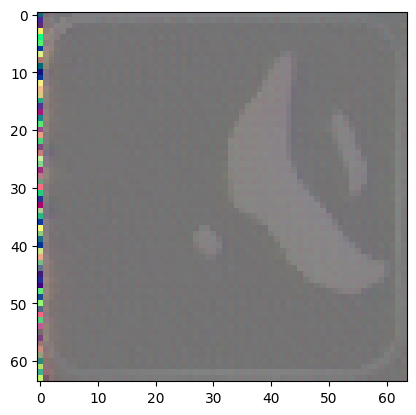

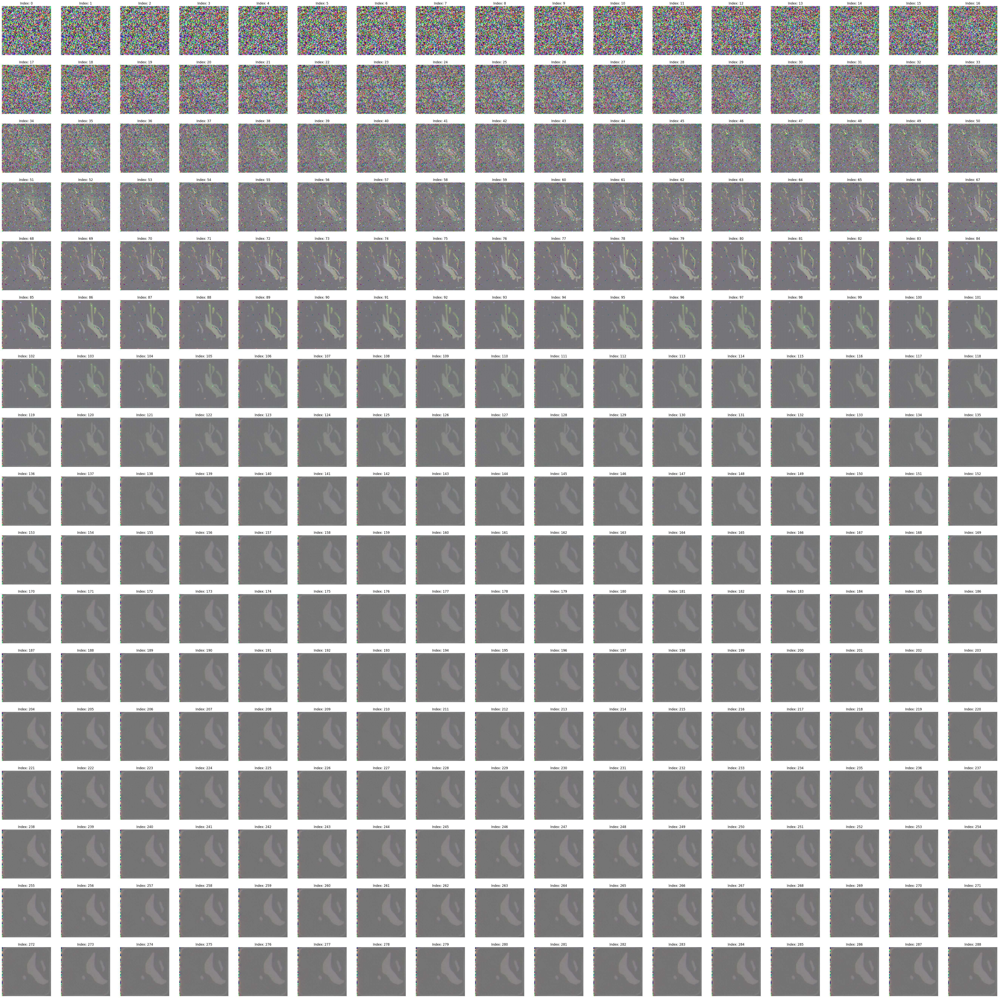

In [ ]:
# ok version
from thumbs.viz import visualize_grid


train.load_weights()
# img, samples = train.gpt_sample_images(1, noise=noisy_img[0], step_size=10, stop_at=mparams.T - 1000)
final_img, samples = train.gpt_sample_images(1, step_size=1, stop_at=700)

plt.imshow(unnormalize_image(final_img[0].numpy()))
plt.show()

imgs = [unnormalize_image(sample[0]) for sample in samples]
visualize_grid(imgs)

I made this way up but it makes sense

100%|██████████| 13/13 [00:01<00:00,  9.07it/s]


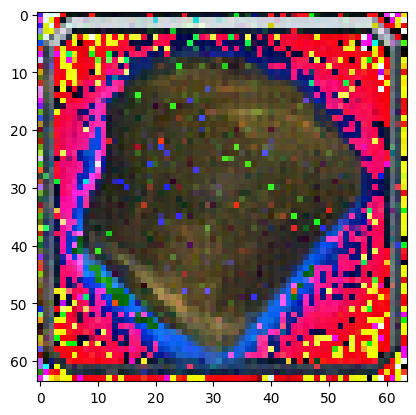

In [ ]:
# with my way
step_size = 80
x, all = train.my_sample_new_images(1, step_size=step_size, noise=noisy_img[0]) 
plt.imshow(unnormalize_image( x[0].numpy()))
plt.show()

# make a nxm grid of things in all
cols = step_size
rows = max(int(len(all) / step_size) + 1, 2)

# fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(min(10*rows, 40), min(3*rows, 40)))
# for i in range(rows):
#     for j in range(cols):
#         if len(all) == 0:
#             axes[i,j].axis('off')  # Hide the axes ticks and labels
#         else:
#             _img, t = all.pop()
#             # img = unnormalize_image( all[i*rows+j][0][0].numpy())
#             # t = all[i*rows+j][0][1]
#             axes[i,j].imshow(unnormalize_image( _img[0].numpy()))
#             axes[i,j].axis('off')  # Hide the axes ticks and labels
#             axes[i,j].set_title(f"t={t}")

# plt.subplots_adjust(wspace=0.0, hspace=0)
# plt.tight_layout()
# plt.show()


### Test noise generation at each t and remove it from a noised image

Loaded previous weights


  0%|          | 0/100 [00:00<?, ?it/s]

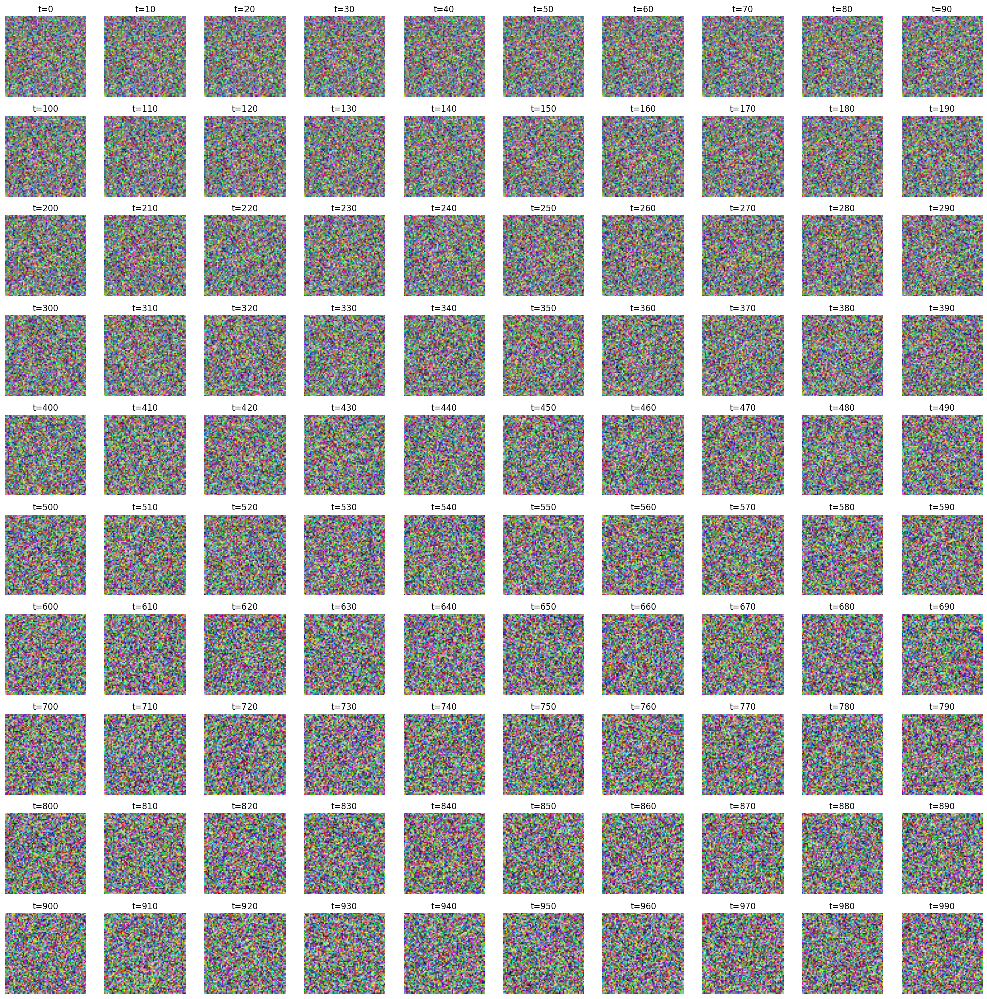

In [ ]:
# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image
from tqdm.auto import tqdm

sample_interval = 10

ncols = 10
nrows = int(mparams.T/sample_interval / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))

images = []

train.load_weights()
for i, t in enumerate(tqdm(range(0, mparams.T - 1, 10))):
    t_tf = tf.constant(t, shape=(1,1))
    noisy, noise = train.add_noise(final_img, t_tf)

    predicted_noise = train.built_model.model.predict([noisy, t_tf], verbose=False)

    reconstructed = train.remove_noise(noisy, predicted_noise, np.expand_dims(t, axis=0))
    images.append(( unnormalize_image(reconstructed[0].numpy()), f"t={t}"))



images.reverse()
for i in range(nrows):
    for j in range(ncols):
        im, label = images.pop()
        axes[i,j].imshow(im)
        axes[i,j].set_title(label)
        axes[i,j].axis('off')

plt.subplots_adjust(wspace=0.0, hspace=0)
plt.tight_layout()
plt.show()
plt.close()


# Manual Run

In [ ]:
train.load_weights()
# manual_img = noisy_img
manual_img = tf.random.normal(shape=tf.shape(noisy_img), mean=0.0, stddev=1.0)
t = 999

Loaded previous weights


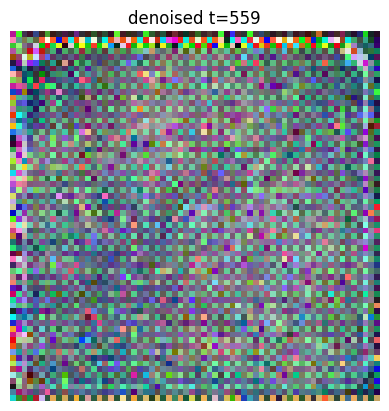

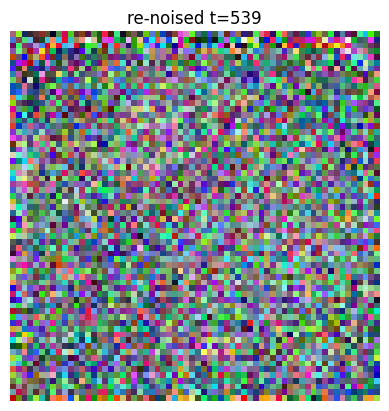

In [ ]:
# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image

next_t = t - 20

t_tf = tf.constant(t, shape=(1,1))
next_t_tf = tf.constant(next_t, shape=(1,1))
predicted_noise = train.built_model.model.predict([manual_img, t_tf], verbose=False)
manual_img = train.remove_noise(manual_img, predicted_noise, t_tf)

plt.imshow(unnormalize_image(manual_img[0].numpy()))
plt.title(f'denoised t={t}')
plt.axis('off')
plt.show()

manual_img, new_noise = train.add_noise(manual_img, next_t_tf)
t = next_t



plt.imshow(unnormalize_image(manual_img[0].numpy()))
plt.title(f're-noised t={t}')
plt.axis('off')
plt.show()


In [ ]:

# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image
from tqdm.auto import tqdm

# next_t = t - 30

start = 999
step = 20
diffusion_img = noisy_img
final = None
for t in tqdm(range(start, 0, -step)):
    if t < 0:
        break
    t_tf = tf.constant(t, shape=(1,1))
    predicted_noise = train.built_model.model.predict([diffusion_img, t_tf], verbose=False)
    diffusion_img = train.remove_noise(diffusion_img, predicted_noise, t_tf)
    final = diffusion_img

    if t - step < 0:
        break
    diffusion_img, new_noise = train.add_noise(diffusion_img, t - step)


plt.imshow(unnormalize_image(final[0].numpy()))
# plt.title(f'denoised t={t}')
plt.axis('off')
plt.show()

# plt.imshow(unnormalize_image(manual_img[0].numpy()))
# plt.title(f're-noised t={t}')
# plt.axis('off')
# plt.show()
